In [2]:
library(tidyverse)
library(tidymodels)
library(RColorBrewer)
library(repr)
library(ggplot2)
install.packages("kknn")
install.packages("themis") 

── Attaching packages ─────────────────────────────────────── tidyverse 1.3.2 ──
✔ ggplot2 3.4.2     ✔ purrr   1.0.1
✔ tibble  3.2.1     ✔ dplyr   1.1.1
✔ tidyr   1.3.0     ✔ stringr 1.5.0
✔ readr   2.1.3     ✔ forcats 0.5.2
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
── Attaching packages ────────────────────────────────────── tidymodels 1.0.0 ──

✔ broom        1.0.2     ✔ rsample      1.1.1
✔ dials        1.1.0     ✔ tune         1.0.1
✔ infer        1.0.4     ✔ workflows    1.1.2
✔ modeldata    1.0.1     ✔ workflowsets 1.0.0
✔ parsnip      1.0.3     ✔ yardstick    1.1.0
✔ recipes      1.0.4     

── Conflicts ───────────────────────────────────────── tidymodels_conflicts() ──
✖ scales::discard() masks purrr::discard()
✖ dplyr::filter()   masks stats::filter()
✖ recipes::fixed()  masks stringr::fixed()
✖ dplyr::lag()      masks stats::lag()
✖ yardstick::spec() masks read

We have loaded seven libraries to use for our data analysis. Tidyverse is used for tidying the data using functions like select, filter, and arrange. Tidymodels is used to build and tune the classifier. RColorBrewer enables us to modify the color of our visualizations so it is more readable and distinct. Repr allows us to change the size of the plot of our variables, ensuring proper and clear visualizations. Ggplot2 is used to conduct any changes in the code for visualization. Kknn package allows us to kknn engine in the recipe so our classifier works. Themis package enables us to do the step_upsample to ensure both classes are balanced to prevent class imbalance. 

In [3]:
url <- "https://raw.githubusercontent.com/sweetmidnights/T1-008-DataScienceProject-32/main/HTRU_2.csv"
pulsar_data <- read_csv(url, col_names = FALSE) 

colnames(pulsar_data) <- c("Mean_integrated", "Standard_Deviation_Integ", "Excess_kurtosis_Integ", "Skewness", "Mean_DM", "Standard_deviation_DM", "Excess_kurtosis_DM", "Skewness_DM", "Class")
head(pulsar_data)

Rows: 17898 Columns: 9
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
dbl (9): X1, X2, X3, X4, X5, X6, X7, X8, X9

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


Mean_integrated,Standard_Deviation_Integ,Excess_kurtosis_Integ,Skewness,Mean_DM,Standard_deviation_DM,Excess_kurtosis_DM,Skewness_DM,Class
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
140.56250,55.68378,-0.23457141,-0.6996484,3.199833,19.11043,7.975532,74.24222,0
102.50781,58.88243,0.46531815,-0.5150879,1.677258,14.86015,10.576487,127.39358,0
103.01562,39.34165,0.32332837,1.0511644,3.121237,21.74467,7.735822,63.17191,0
136.75000,57.17845,-0.06841464,-0.6362384,3.642977,20.95928,6.896499,53.59366,0
88.72656,40.67223,0.60086608,1.1234917,1.178930,11.46872,14.269573,252.56731,0
93.57031,46.69811,0.53190485,0.4167211,1.636288,14.54507,10.621748,131.39400,0


First, We tried to load the dataset from the internet onto R. We copied the URL from Git Hub; We had to download the dataset, upload it to our group's Git Hub repository, and then copy the URL. Since the dataset has comma-separated values, we used read_csv. Also, the dataset did not have column names, so we put col_names as false and manually labeled the columns using the colnames function and column names from the original dataset. Finally, We used head to show the first six observations since it is a large dataset.

In [5]:
types_of_stars <- pulsar_data |>
                  distinct(Class)
types_of_stars

Class
<dbl>
0
1


We used distinct to see the different classes present in the class column, to rename correctly.

In [8]:
pulsar <- pulsar_data |>
  mutate(Class = as_factor(Class)) |>
  mutate(Class = fct_recode(Class, "Pulsar" = "1", "Not Pulsar" = "0"))
head(pulsar)

Mean_integrated,Standard_Deviation_Integ,Excess_kurtosis_Integ,Skewness,Mean_DM,Standard_deviation_DM,Excess_kurtosis_DM,Skewness_DM,Class
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>
140.56250,55.68378,-0.23457141,-0.6996484,3.199833,19.11043,7.975532,74.24222,Not Pulsar
102.50781,58.88243,0.46531815,-0.5150879,1.677258,14.86015,10.576487,127.39358,Not Pulsar
103.01562,39.34165,0.32332837,1.0511644,3.121237,21.74467,7.735822,63.17191,Not Pulsar
136.75000,57.17845,-0.06841464,-0.6362384,3.642977,20.95928,6.896499,53.59366,Not Pulsar
88.72656,40.67223,0.60086608,1.1234917,1.178930,11.46872,14.269573,252.56731,Not Pulsar
93.57031,46.69811,0.53190485,0.4167211,1.636288,14.54507,10.621748,131.39400,Not Pulsar


Next, we had to tidy our data using mutate in the tidyverse to rename the data in the Class column from 0 and 1 to Pulsar and Not Pulsar, making it easier to differentiate between them. Once again, we used head as the dataset is large. 

In [10]:
pulsar_data <- pulsar |>
                select(Mean_integrated, Standard_deviation_DM, Class)
head(pulsar_data)

Mean_integrated,Standard_deviation_DM,Class
<dbl>,<dbl>,<fct>
140.56250,19.11043,Not Pulsar
102.50781,14.86015,Not Pulsar
103.01562,21.74467,Not Pulsar
136.75000,20.95928,Not Pulsar
88.72656,11.46872,Not Pulsar
93.57031,14.54507,Not Pulsar


We only select the two column (predictor variables) required to build the classifier, which are Mean-Integrated and Standard Deviation of DM-SNR.

In [13]:
set.seed(1)
pulsar_split <- initial_split(pulsar_data, prop = 0.75, strata = Class) 
pulsar_train <- training(pulsar_split)
pulsar_test <- testing(pulsar_split)
glimpse(pulsar_train)
glimpse(pulsar_test)


Rows: 13,423
Columns: 3
$ Mean_integrated       <dbl> 102.50781, 103.01562, 136.75000, 93.57031, 119.4…
$ Standard_deviation_DM <dbl> 14.860146, 21.744669, 20.959280, 14.545074, 9.27…
$ Class                 <fct> Not Pulsar, Not Pulsar, Not Pulsar, Not Pulsar, …
Rows: 4,475
Columns: 3
$ Mean_integrated       <dbl> 140.56250, 88.72656, 142.07812, 133.25781, 109.6…
$ Standard_deviation_DM <dbl> 19.11043, 11.46872, 29.00990, 12.00781, 12.07290…
$ Class                 <fct> Not Pulsar, Not Pulsar, Not Pulsar, Not Pulsar, …


Next, now that our data is tidy. We split the data set into training and testing with 75% of the data for training. We use glimpse to see the total observations in the training set (13,423) and the testing set (4475).

In [37]:
pulsar_proportions <- pulsar_train |>
                      group_by(Class) |>
                      summarize(n = n()) |>
                      mutate(percent = 100*n/nrow(pulsar_train))

pulsar_proportions

Class,n,percent
<fct>,<int>,<dbl>
Not Pulsar,12200,90.888773
Pulsar,1223,9.111227


We used this code to determine the proportion of the training set that is pulsar and not pulsar. We did this by grouping the classes (Pulsar and Not Pulsar) and counting the number of rows of each group and dividing it by the initial number of rows and multiplying it with 100 to get the percentage.

In [38]:
library(themis)

balance_recipe <- recipe(Class ~ ., data = pulsar_train) |>
  step_upsample(Class, over_ratio = 1, skip = FALSE) |>
    prep()
pulsar_balanced <- bake(balance_recipe, pulsar_train)
pulsar_balanced |>
    group_by(Class) |>
    summarize(n = n())

Class,n
<fct>,<int>
Not Pulsar,12200
Pulsar,12200


As we saw, 91% of the stars are not pulsar and only 9% are pulsar, this could lead to class imbalance. To prevent this we used step_upsample from library themis through the recipe to make sure both class types have an equal proportion.

In [39]:
pulsar_proportions_2 <- pulsar_balanced |>
                      group_by(Class) |>
                      summarize(n = n()) |>
                      mutate(percent = 100*n/nrow(pulsar_balanced))

pulsar_proportions_2

Class,n,percent
<fct>,<int>,<dbl>
Not Pulsar,12200,50
Pulsar,12200,50


This code is the same as the one used to calculate proportions in the training set, now we do it on the balanced data set and it shows both class types are equal in number.

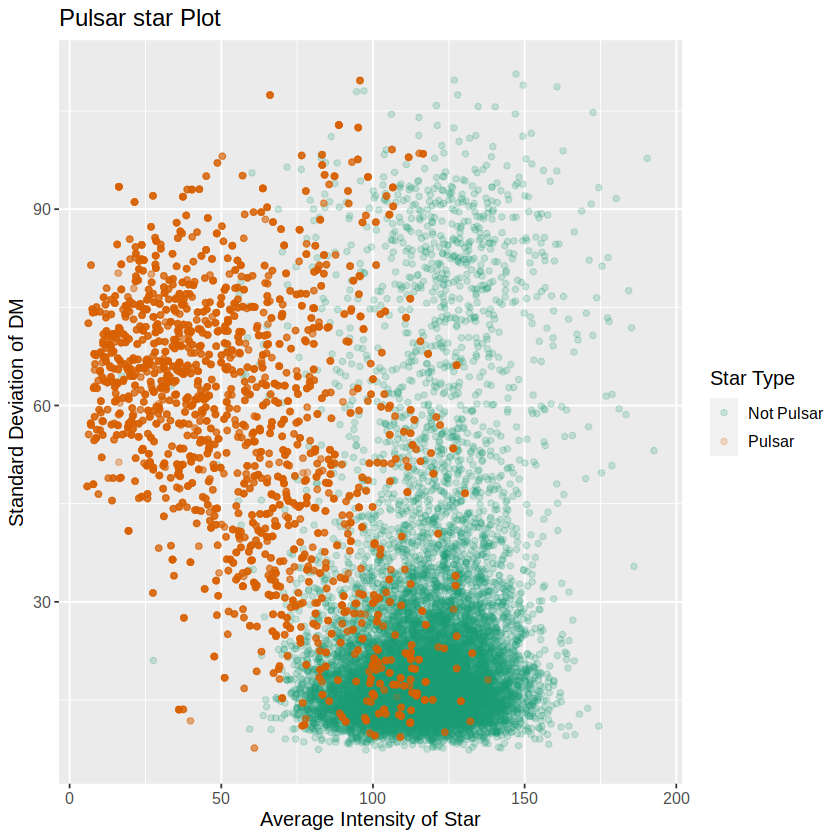

In [40]:
plot_pulsar <- ggplot(pulsar_balanced , aes(x = Mean_integrated, y = Standard_deviation_DM, color = Class)) +
                   geom_point(alpha = 0.2) +
                   xlab("Average Intensity of Star") +
                   ylab("Standard Deviation of DM") + 
                   labs(color = 'Star Type') +
                   theme(text = element_text(size = 12)) +
                   scale_color_brewer(palette = "Dark2") +
                   ggtitle("Pulsar star Plot") #title for the plot

plot_pulsar

Now, we create an initial visualization to observe the distribution of the classes. From this plot, we notice that most of the pulsar stars have a low average intensity but a high standard deviation. All of the non-pulsar stars have a very high intensity and most of them have a low standard deviation.

In [41]:

# pulsar_recipe <- recipe(Class ~ ., data = pulsar_train) |>
#                     step_scale(all_predictors()) |>
#                     step_center(all_predictors())
# pulsar_recipe

# knn_spec <- nearest_neighbor(weight_func = "rectangular", neighbors = 3) |>
#             set_engine("kknn") |>
#             set_mode("classification")
# knn_spec

#  knn_fit <- workflow() |>
#           add_recipe(pulsar_recipe) |>
#            add_model(knn_spec) |>
#            fit(data = pulsar_train)
# knn_fit



Recipe

Inputs:

      role #variables
   outcome          1
 predictor          2

Operations:

Scaling for all_predictors()
Centering for all_predictors()

K-Nearest Neighbor Model Specification (classification)

Main Arguments:
  neighbors = 3
  weight_func = rectangular

Computational engine: kknn 


══ Workflow [trained] ══════════════════════════════════════════════════════════
Preprocessor: Recipe
Model: nearest_neighbor()

── Preprocessor ────────────────────────────────────────────────────────────────
2 Recipe Steps

• step_scale()
• step_center()

── Model ───────────────────────────────────────────────────────────────────────

Call:
kknn::train.kknn(formula = ..y ~ ., data = data, ks = min_rows(3,     data, 5), kernel = ~"rectangular")

Type of response variable: nominal
Minimal misclassification: 0.03166207
Best kernel: rectangular
Best k: 3

In [43]:
pulsar_train_split <- initial_split(pulsar_train, prop = 0.75, strata = Class)
pulsar_subtrain <- training(pulsar_train_split)
pulsar_validation <- testing(pulsar_train_split)

# recreate the standardization recipe from before 
# (since it must be based on the training data)
pulsar_recipe <- recipe(Class ~ Mean_integrated + Standard_deviation_DM, 
                        data = pulsar_subtrain) |>
  step_scale(all_predictors()) |>
  step_center(all_predictors())

knn_spec <- nearest_neighbor(weight_func = "rectangular", neighbors = tune()) |>
            set_engine("kknn") |>
            set_mode("classification")

# fit the knn model (we can reuse the old knn_spec model from before)
knn_fit <- workflow() |>
  add_recipe(pulsar_recipe) |>
  add_model(knn_spec) |>
  fit(data = pulsar_subtrain)
# NOT SURE IF THIS IS MEANT TO BE USED HERE.
# get predictions on the validation data
validation_predicted <- predict(knn_fit, pulsar_validation) |>
  bind_cols(pulsar_validation)

# compute the accuracy
acc <- validation_predicted |>
  metrics(truth = Class, estimate = .pred_class) |>
  filter(.metric == "accuracy") |>
  select(.estimate) |>
  pull()

acc

[1] 0.9699046

We start building the classifier by splitting the training set once again into another training set and testing set to build the classifier. Next, we code the recipe by scaling and centering the predictors so they all have equal weightage. Then, we code the model using K-nearest neighbor algorithm and the engine as kknn. Finally, we put in a workflow to bypass prepping and baking it separately. 

In [14]:
pulsar_vfold <- vfold_cv(pulsar_subtrain, v = 10, strata = Class)

ERROR: Error in eval_select_impl(NULL, .vars, expr(c(!!!dots)), include = .include, : object 'pulsar_subtrain' not found


We now perform the cross-validation by separating the data set into ten equal groups. 

In [20]:
# pulsar_recipe <- recipe(Class ~ Mean_integrated + Standard_deviation_DM, 
#                         data = pulsar_train) |>
#   step_scale(all_predictors()) |>
#   step_center(all_predictors())

# knn_fit <- workflow() |>
#   add_recipe(pulsar_recipe) |>
#   add_model(knn_spec) |>
#   fit_resamples(resamples = pulsar_vfold)

In [53]:
k_vals <- tibble(neighbors = seq(from = 1, to = 100, by = 5))

knn_results <- workflow() |>
  add_recipe(pulsar_recipe) |>
  add_model(knn_spec) |>
  tune_grid(resamples = pulsar_vfold, grid = k_vals) |>
  collect_metrics() 

accuracies <- knn_results |>
  filter(.metric == "accuracy")

accuracies

neighbors,.metric,.estimator,mean,n,std_err,.config
<dbl>,<chr>,<chr>,<dbl>,<int>,<dbl>,<chr>
1,accuracy,binary,0.9564917,10,0.0020413882,Preprocessor1_Model01
6,accuracy,binary,0.9708707,10,0.0008994707,Preprocessor1_Model02
11,accuracy,binary,0.9721373,10,0.0011821396,Preprocessor1_Model03
16,accuracy,binary,0.9725841,10,0.0010413265,Preprocessor1_Model04
21,accuracy,binary,0.9724351,10,0.0011601157,Preprocessor1_Model05
26,accuracy,binary,0.9731801,10,0.0012121904,Preprocessor1_Model06
31,accuracy,binary,0.9730310,10,0.0012012944,Preprocessor1_Model07
36,accuracy,binary,0.9733291,10,0.0013280007,Preprocessor1_Model08
41,accuracy,binary,0.9732546,10,0.0013630204,Preprocessor1_Model09


This code runs the classifier for every value of K from 1-100 taking a step of 5, each time it calculates the accuracy and produces a table of all the K-values accuracy. 

In [16]:
new <- arrange(accuracies, by = desc(mean))
head(new, n = 1)


ERROR: Error in arrange(accuracies, by = desc(mean)): object 'accuracies' not found


This code takes arranges the data set with the highest accuracy on the top and we choose the first one on the data set. We record the K-value of this observation.

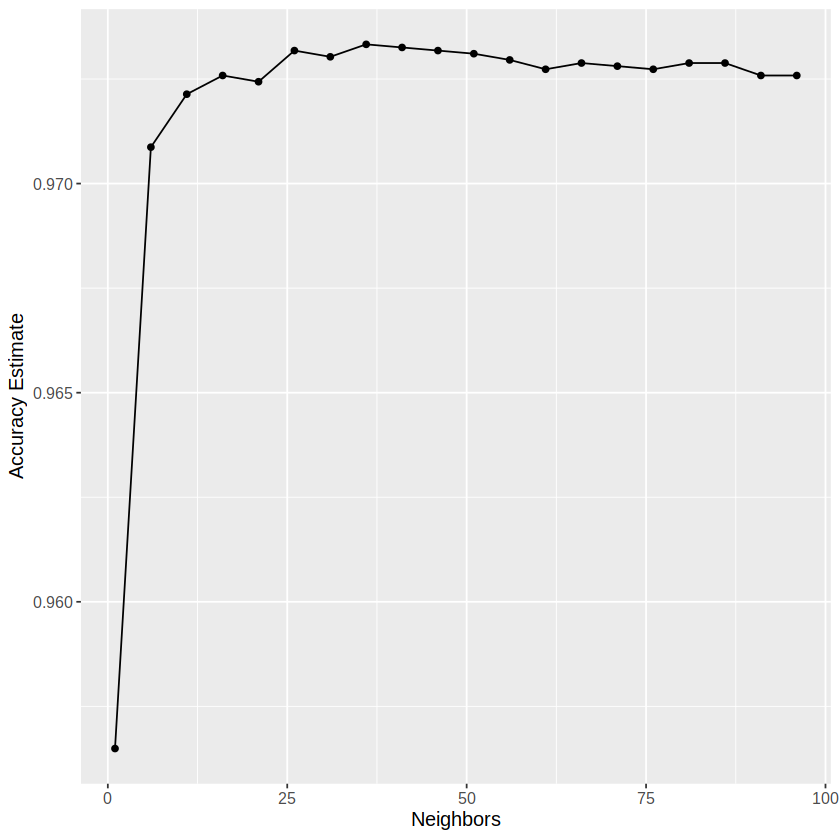

In [47]:
accuracy_vs_k <- ggplot(accuracies, aes(x = neighbors, y = mean)) +
  geom_point() +
  geom_line() +
  labs(x = "Neighbors", y = "Accuracy Estimate") + 
  theme(text = element_text(size = 12))

accuracy_vs_k

This is a visualization of the accuracy within the range of possible K value, this confirms that the K-value with the maximum accuracy is between 25 and 50.

In [51]:
knn_spec_tuned <- nearest_neighbor(weight_func = "rectangular", neighbors = 36) |>
            set_engine("kknn") |>
            set_mode("classification")

knn_fit_tuned <- workflow() |>
                    add_recipe(pulsar_recipe) |>
                    add_model(knn_spec_tuned) |>
                    fit(data = pulsar_balanced)

We run the workflow, but this time we substitute the value of k with the highest accuracy.

In [52]:
# get predictions on the validation data
validation_predicted_2 <- predict(knn_fit_tuned, pulsar_test) |>
  bind_cols(pulsar_test)

# compute the accuracy
acc <- validation_predicted_2 |>
  metrics(truth = Class, estimate = .pred_class) |>
  filter(.metric == "accuracy") |>
  select(.estimate) |>
  pull()
acc

[1] 0.9334078

We now test the accuracy using the pulsar testing data set and it produces a 93% accuracy.